In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

In [2]:
df=pd.read_csv('../loan/loan.csv')

C:\Users\pushk\AppData\Local\Temp\ipykernel_12048\1625466947.py:1: DtypeWarning: Columns (47) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv('../loan/loan.csv')


In [3]:
df.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


In [4]:
df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 111 columns):
 #    Column                          Non-Null Count  Dtype  
---   ------                          --------------  -----  
 0    id                              39717 non-null  int64  
 1    member_id                       39717 non-null  int64  
 2    loan_amnt                       39717 non-null  int64  
 3    funded_amnt                     39717 non-null  int64  
 4    funded_amnt_inv                 39717 non-null  float64
 5    term                            39717 non-null  object 
 6    int_rate                        39717 non-null  object 
 7    installment                     39717 non-null  float64
 8    grade                           39717 non-null  object 
 9    sub_grade                       39717 non-null  object 
 10   emp_title                       37258 non-null  object 
 11   emp_length                      38642 non-null  object 
 12   home_ownership  

In [5]:
df.isnull().sum()

id                                0
member_id                         0
loan_amnt                         0
funded_amnt                       0
funded_amnt_inv                   0
                              ...  
tax_liens                        39
tot_hi_cred_lim               39717
total_bal_ex_mort             39717
total_bc_limit                39717
total_il_high_credit_limit    39717
Length: 111, dtype: int64

In [6]:
df.columns

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade',
       ...
       'num_tl_90g_dpd_24m', 'num_tl_op_past_12m', 'pct_tl_nvr_dlq',
       'percent_bc_gt_75', 'pub_rec_bankruptcies', 'tax_liens',
       'tot_hi_cred_lim', 'total_bal_ex_mort', 'total_bc_limit',
       'total_il_high_credit_limit'],
      dtype='object', length=111)

**Deleting columns containing all & more than 50% nulls**

In [7]:
for i in df.columns:
    if df[i].isnull().sum()>=39717/2:
        df.drop(i, axis=1, inplace= True)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 54 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          39717 non-null  int64  
 1   member_id                   39717 non-null  int64  
 2   loan_amnt                   39717 non-null  int64  
 3   funded_amnt                 39717 non-null  int64  
 4   funded_amnt_inv             39717 non-null  float64
 5   term                        39717 non-null  object 
 6   int_rate                    39717 non-null  object 
 7   installment                 39717 non-null  float64
 8   grade                       39717 non-null  object 
 9   sub_grade                   39717 non-null  object 
 10  emp_title                   37258 non-null  object 
 11  emp_length                  38642 non-null  object 
 12  home_ownership              39717 non-null  object 
 13  annual_inc                  397

**Finding** *Out of 111 columns only 54 columns have less than 50% null values.*

In [9]:
df.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,last_pymnt_amnt,last_credit_pull_d,collections_12_mths_ex_med,policy_code,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,171.62,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,119.66,Sep-13,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,649.91,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,357.48,Apr-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,67.79,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0


**Now let us try to fill the remaining null values**

In [10]:
null=[i for i in df.columns if df[i].isnull().sum()!=0] 
null

['emp_title',
 'emp_length',
 'desc',
 'title',
 'revol_util',
 'last_pymnt_d',
 'last_credit_pull_d',
 'collections_12_mths_ex_med',
 'chargeoff_within_12_mths',
 'pub_rec_bankruptcies',
 'tax_liens']

In [11]:
df[null].head() # Using a subest list for viewing only fields containing nulls

,emp_title,emp_length,desc,title,revol_util,last_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,chargeoff_within_12_mths,pub_rec_bankruptcies,tax_liens
0,NaN,10+ years,Borrower added on 12/22/11 > I need to upgra...,Computer,83.70%,Jan-15,May-16,0.0,0.0,0.0,0.0
1,Ryder,< 1 year,Borrower added on 12/22/11 > I plan to use t...,bike,9.40%,Apr-13,Sep-13,0.0,0.0,0.0,0.0
2,NaN,10+ years,NaN,real estate business,98.50%,Jun-14,May-16,0.0,0.0,0.0,0.0
3,AIR RESOURCES BOARD,10+ years,Borrower added on 12/21/11 > to pay for prop...,personel,21%,Jan-15,Apr-16,0.0,0.0,0.0,0.0
4,University Medical Group,1 year,Borrower added on 12/21/11 > I plan on combi...,Personal,53.90%,May-16,May-16,0.0,0.0,0.0,0.0


In [12]:
df[null].dtypes

emp_title                      object
emp_length                     object
desc                           object
title                          object
revol_util                     object
last_pymnt_d                   object
last_credit_pull_d             object
collections_12_mths_ex_med    float64
chargeoff_within_12_mths      float64
pub_rec_bankruptcies          float64
tax_liens                     float64
dtype: object

**Working on the object (non-numeric) nulls**

In [13]:
df.emp_title.value_counts()

US Army                              134
Bank of America                      109
IBM                                   66
AT&T                                  59
Kaiser Permanente                     56
                                    ... 
Community College of Philadelphia      1
AMEC                                   1
lee county sheriff                     1
Bacon County Board of Education        1
Evergreen Center                       1
Name: emp_title, Length: 28820, dtype: int64

In [14]:
df.emp_length.value_counts()

10+ years    8879
< 1 year     4583
2 years      4388
3 years      4095
4 years      3436
5 years      3282
1 year       3240
6 years      2229
7 years      1773
8 years      1479
9 years      1258
Name: emp_length, dtype: int64

In [15]:
df.desc.value_counts()

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              210
Debt Consolidation                                                                                                                                                                                                                                                                                                                                    

In [16]:
df.title.value_counts()

Debt Consolidation                  2184
Debt Consolidation Loan             1729
Personal Loan                        659
Consolidation                        517
debt consolidation                   505
                                    ... 
your rate is better than my rate       1
Concession Trailer                     1
gregs                                  1
EZover                                 1
JAL Loan                               1
Name: title, Length: 19615, dtype: int64

In [17]:
#This category is actually numeric and should be converted to numeric removing % symbol first handling missing values
df.revol_util.value_counts()

0%        977
0.20%      63
63%        62
40.70%     58
66.70%     58
         ... 
25.74%      1
47.36%      1
24.65%      1
10.61%      1
7.28%       1
Name: revol_util, Length: 1089, dtype: int64

In [18]:
df['revol_util'].fillna(df['revol_util'].mode(), inplace=True)

In [19]:
df['revol_util']=df['revol_util'].apply(lambda x: 0 if str(x)=='nan' else float(str(x)[:-1]))

In [20]:
df.last_pymnt_d.value_counts()

May-16    1256
Mar-13    1026
Dec-14     945
May-13     907
Feb-13     869
          ... 
Jun-08      10
Nov-08      10
Mar-08       5
Jan-08       4
Feb-08       1
Name: last_pymnt_d, Length: 101, dtype: int64

In [21]:
df.last_credit_pull_d.value_counts()

May-16    10308
Apr-16     2547
Mar-16     1123
Feb-13      843
Feb-16      736
          ...  
May-08        1
Jun-08        1
Jul-08        1
May-07        1
Jul-07        1
Name: last_credit_pull_d, Length: 106, dtype: int64

**Action** *Most often it is better to leave the non numeric nulls as another category. It lets the model learn from whatever is available and missing without any unnecessary assumptions. Missing values act as another charecteristic of the model. This will also help us as we will not fill any value in last_pymnt_d if the person has not made any payment. Similarly for last_credit_pull_d.*

In [22]:
cat_col=['emp_title', 'emp_length', 'desc', 'title', 'revol_util', 'last_pymnt_d', 'last_credit_pull_d']
for i in cat_col:
    df[i].fillna('Missing Value', inplace=True)

In [23]:
df[['emp_title', 'emp_length', 'desc', 'title', 'revol_util', 'last_pymnt_d', 'last_credit_pull_d']].isnull().sum()

emp_title             0
emp_length            0
desc                  0
title                 0
revol_util            0
last_pymnt_d          0
last_credit_pull_d    0
dtype: int64

**Now working on the numeric nulls**

In [24]:
df[null].dtypes

emp_title                      object
emp_length                     object
desc                           object
title                          object
revol_util                    float64
last_pymnt_d                   object
last_credit_pull_d             object
collections_12_mths_ex_med    float64
chargeoff_within_12_mths      float64
pub_rec_bankruptcies          float64
tax_liens                     float64
dtype: object

In [25]:
df[null].describe()

,revol_util,collections_12_mths_ex_med,chargeoff_within_12_mths,pub_rec_bankruptcies,tax_liens
count,39717.000000,39661.0,39661.0,39020.000000,39678.0
mean,48.770677,0.0,0.0,0.043260,0.0
std,28.367689,0.0,0.0,0.204324,0.0
min,0.000000,0.0,0.0,0.000000,0.0
25%,25.300000,0.0,0.0,0.000000,0.0
50%,49.200000,0.0,0.0,0.000000,0.0
75%,72.300000,0.0,0.0,0.000000,0.0
max,99.900000,0.0,0.0,2.000000,0.0


In [26]:
df.collections_12_mths_ex_med.value_counts()

0.0    39661
Name: collections_12_mths_ex_med, dtype: int64

In [27]:
df.chargeoff_within_12_mths.value_counts()

0.0    39661
Name: chargeoff_within_12_mths, dtype: int64

In [28]:
df.tax_liens.value_counts()

0.0    39678
Name: tax_liens, dtype: int64

**Finding** *3 of these numeric column only one value (i.e. 0 here) which is of no use. We need to see these in the whole data frame and drop such columns as they do not add any value.*

In [29]:
df.pub_rec_bankruptcies.value_counts()

0.0    37339
1.0     1674
2.0        7
Name: pub_rec_bankruptcies, dtype: int64

In [30]:
df.pub_rec_bankruptcies.dtype==object

False

**Finding** *As we can see that there are some pub_rec_bankruptcies contains how many times the person has publically filed for bankruptcies. It is very important column and if we fill median (i.e. 0 here) we might be making unnecessary assumptions which could lead to us giving loans to defaulters. The best way out here would be to impute the value to another similar prson. So we believe, K Means imputer would work very well here.*

In [31]:
# Can't directly assign as it will lead to the same memory loaction being assigned to both data frames.
df1=df.copy()

In [32]:
#Identifying Numerical features for KNNImputer,as it does not work on categorical features.

numerical_features=[i for i in df1.columns if df1[i].dtype!=object]
print(numerical_features)

['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'installment', 'annual_inc', 'dti', 'delinq_2yrs', 'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'out_prncp', 'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries', 'collection_recovery_fee', 'last_pymnt_amnt', 'collections_12_mths_ex_med', 'policy_code', 'acc_now_delinq', 'chargeoff_within_12_mths', 'delinq_amnt', 'pub_rec_bankruptcies', 'tax_liens']


In [33]:
from sklearn.impute import KNNImputer

In [34]:
imputer = KNNImputer(n_neighbors=5)
df1[numerical_features]=imputer.fit_transform(df1[numerical_features])

In [35]:
df1.pub_rec_bankruptcies.value_counts()

0.0    37378
1.0     2142
0.8       64
0.6       53
0.2       39
0.4       34
2.0        7
Name: pub_rec_bankruptcies, dtype: int64

**Finding** *Realised that KNN imputer only works on numerical features so tried to impute the missing numeric values using other numeric values only. But the results seem to be more unreliable. We are getting a few decimal values probably due to using 5 neighbor mean that can give such values which can be reounded to closest integer. But seems like most people are getting assigned a value of 1, which we don't think should be correct as most people would not have a sigle bankrupcy. So, we believe that we are losing a lot of data when we select only numeric features to compute using KNN imputer. Let us fill the missing numeric values with median only then.*

In [36]:
num_col=['collections_12_mths_ex_med', 'chargeoff_within_12_mths', 'pub_rec_bankruptcies', 'tax_liens']

In [37]:
for i in num_col:
    df[i].fillna(df[i].median(), inplace=True)

In [38]:
df.isnull().sum()

id                            0
member_id                     0
loan_amnt                     0
funded_amnt                   0
funded_amnt_inv               0
term                          0
int_rate                      0
installment                   0
grade                         0
sub_grade                     0
emp_title                     0
emp_length                    0
home_ownership                0
annual_inc                    0
verification_status           0
issue_d                       0
loan_status                   0
pymnt_plan                    0
url                           0
desc                          0
purpose                       0
title                         0
zip_code                      0
addr_state                    0
dti                           0
delinq_2yrs                   0
earliest_cr_line              0
inq_last_6mths                0
open_acc                      0
pub_rec                       0
revol_bal                     0
revol_ut

**All Missing Values are now Handeled. Let us now take action on the finding that most of the columns have only one value, dropping them as they don't give any information.**

In [39]:
df.nunique()

id                            39717
member_id                     39717
loan_amnt                       885
funded_amnt                    1041
funded_amnt_inv                8205
term                              2
int_rate                        371
installment                   15383
grade                             7
sub_grade                        35
emp_title                     28821
emp_length                       12
home_ownership                    5
annual_inc                     5318
verification_status               3
issue_d                          55
loan_status                       3
pymnt_plan                        1
url                           39717
desc                          26528
purpose                          14
title                         19616
zip_code                        823
addr_state                       50
dti                            2868
delinq_2yrs                      11
earliest_cr_line                526
inq_last_6mths              

In [40]:
single_value_col_list=[i for i in df.columns if df[i].nunique()==1]

In [41]:
df[single_value_col_list].nunique()

pymnt_plan                    1
initial_list_status           1
collections_12_mths_ex_med    1
policy_code                   1
application_type              1
acc_now_delinq                1
chargeoff_within_12_mths      1
delinq_amnt                   1
tax_liens                     1
dtype: int64

In [42]:
df.drop(single_value_col_list, axis=1, inplace=True)

In [43]:
df.nunique()

id                         39717
member_id                  39717
loan_amnt                    885
funded_amnt                 1041
funded_amnt_inv             8205
term                           2
int_rate                     371
installment                15383
grade                          7
sub_grade                     35
emp_title                  28821
emp_length                    12
home_ownership                 5
annual_inc                  5318
verification_status            3
issue_d                       55
loan_status                    3
url                        39717
desc                       26528
purpose                       14
title                      19616
zip_code                     823
addr_state                    50
dti                         2868
delinq_2yrs                   11
earliest_cr_line             526
inq_last_6mths                 9
open_acc                      40
pub_rec                        5
revol_bal                  21711
revol_util

In [44]:
df.shape

(39717, 45)

**Removing %age symbol from interest rate and months from term, to make it numeric**

In [45]:
df.int_rate.value_counts()

10.99%    956
13.49%    826
11.49%    825
7.51%     787
7.88%     725
         ... 
18.36%      1
16.96%      1
16.15%      1
16.01%      1
17.44%      1
Name: int_rate, Length: 371, dtype: int64

In [46]:
df['int_rate']=df['int_rate'].apply(lambda x: float(x[:-1]))


In [47]:
df.term.value_counts()

 36 months    29096
 60 months    10621
Name: term, dtype: int64

In [48]:
df['term']=df['term'].apply(lambda x: int(x.split()[0].strip()))

**Creating a new feature calcuating the principal remaining**, as is one the most important factors to see for defaulters and contributes to NPA for bank. 

In [49]:
df['prncp_rem']=df['loan_amnt']-df['total_rec_prncp']

In [50]:
df.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,pub_rec_bankruptcies,prncp_rem
0,1077501,1296599,5000,5000,4975.0,36,10.65,162.87,B,B2,...,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,May-16,0.0,0.00
1,1077430,1314167,2500,2500,2500.0,60,15.27,59.83,C,C4,...,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,Sep-13,0.0,2043.54
2,1077175,1313524,2400,2400,2400.0,36,15.96,84.33,C,C5,...,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,May-16,0.0,0.00
3,1076863,1277178,10000,10000,10000.0,36,13.49,339.31,C,C1,...,10000.00,2214.92,16.97,0.00,0.00,Jan-15,357.48,Apr-16,0.0,0.00
4,1075358,1311748,3000,3000,3000.0,60,12.69,67.79,B,B5,...,2475.94,1037.39,0.00,0.00,0.00,May-16,67.79,May-16,0.0,524.06


In [51]:
# sanity check (Principal Remaining should be 0 in case of loan_status Fully Paid) also limiting to 1$ difference.
df2=df[(df['loan_status']=='Fully Paid') & (abs(df['prncp_rem'])>1)]

In [52]:
df2['prncp_rem'].value_counts()

4975.0     10
2500.0     10
4375.0      8
1500.0      8
9275.0      8
           ..
6875.0      1
7850.0      1
9350.0      1
9700.0      1
19350.0     1
Name: prncp_rem, Length: 549, dtype: int64

In [53]:
df2.shape

(1445, 46)

In [54]:
#Exporting to excel to check the inconsistancy
df2.to_csv('df2.csv')

**Finding** *There seems to be a huge inconsistancy in data contained in df2. When we subtract the loan amount with total principal paid, the difference remains vary large in above shown cases. We might be reading something wrong.*

**Assumption** *For the sake of keeping the analysis consistant, let us assign prncp_rem as 0 when the loan is marked as fully paid.

In [55]:
#Assigning 0 when loan is marked as paid, else keep same as before
df['prncp_rem']=df.apply(lambda x: 0 if x['loan_status']=='Fully Paid' else float(x['prncp_rem']), axis=1)

In [56]:
#Rechecking the condition now
df2=df[(df['loan_status']=='Fully Paid') & (abs(df['prncp_rem'])>1)]

In [57]:
df2.shape #Resolved now

(0, 46)

**Before going forward let us also remove categorical feaures that might not be useful**

In [58]:
df.zip_code.value_counts()

100xx    597
945xx    545
112xx    516
606xx    503
070xx    473
        ... 
381xx      1
378xx      1
739xx      1
396xx      1
469xx      1
Name: zip_code, Length: 823, dtype: int64

In [59]:
#url, desc are not useful also zip_code has so many values making analysis not possible. Anyways we have state codes also to analyse
df.drop(['url', 'desc', 'zip_code'], axis=1, inplace=True)

In [60]:
df.shape

(39717, 43)

**Let us also check the correlation coefficients, and check if seaborn clustermap can identify an highlight clusters of correlated columns.**

# Starting with Bivaritae analysis so as to drop a few more correlated columns

C:\Users\pushk\AppData\Local\Temp\ipykernel_12048\2806754054.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns_plot = sns.clustermap(df.corr(), cmap='coolwarm', annot=True, figsize=(20,20))


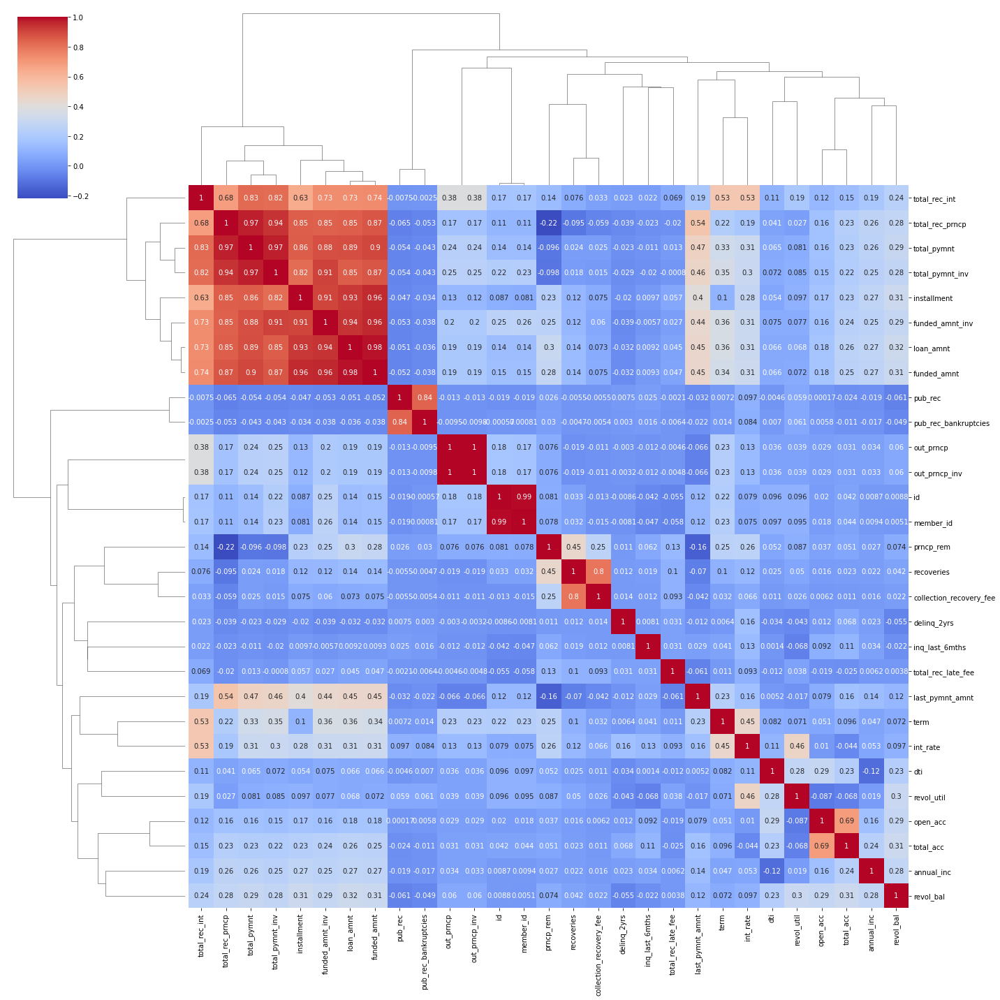

In [61]:
sns_plot = sns.clustermap(df.corr(), cmap='coolwarm', annot=True, figsize=(20,20))

**Finding** *We can see that some columns are highly correlated. We might want to drop totally correlated columns as they might be redundent.For instance out_prncp and out_prncp_inv are having 1 correlation coefficient.*

**Inferances**
1. Looking at the **correlation coefficients** we can infer that many fields are very highly correlated (correlation coeff>.95).

    a. out_prncp and out_prncp_inv (1)
    
    b. id and member_id (.99)
    
    c. loan_amnt and funded_amnt (.98)
    
    d. total_pymnt and total_pymnt_inv (0.97)
    
    e. total_pymnt and total_rec_prncp (0.97)
    
    f. funded_amnt and funded_amnt_inv (0.96)
    
    g. loan_amnt and funded_amnt_inv (0.96)
    
    h. installment and funded_amnt (.96)
    
    
2. We can see that most of these columns are clearly reundant and we can drop one of them. 


3. We also see that even tough installment is highly correlated with funded_amount we can keep it as the values are pretty different. Same for total_pymnt and total_rec_prncp. **As shown by dendograms as well.**


4. Also we will not be using id or member_id as they don't store any value and are just reference nos, still we can drop one of them as one identifier would suffice our needs.

In [62]:
df.drop(['out_prncp_inv', 'member_id', 'funded_amnt', 'total_pymnt_inv', 'funded_amnt_inv'], axis=1, inplace=True)

In [63]:
df.shape

(39717, 38)

**It looks much better now.**

C:\Users\pushk\AppData\Local\Temp\ipykernel_12048\2806754054.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns_plot = sns.clustermap(df.corr(), cmap='coolwarm', annot=True, figsize=(20,20))


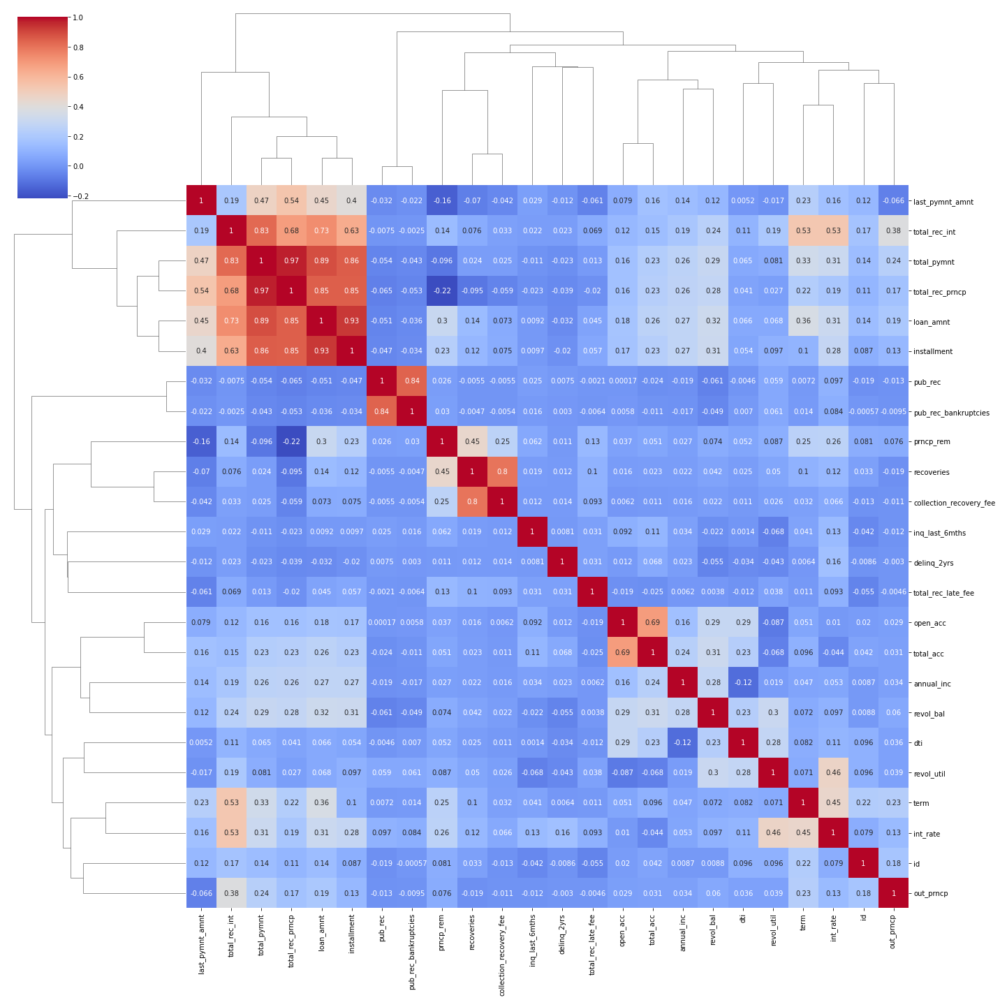

In [64]:
sns_plot = sns.clustermap(df.corr(), cmap='coolwarm', annot=True, figsize=(20,20))

**Dropping the rows with loan_status = "Current" at they are not in final stage and we won't able conclude anything using them.**

In [65]:
df.loan_status.value_counts()

Fully Paid     32950
Charged Off     5627
Current         1140
Name: loan_status, dtype: int64

In [66]:
df=df[df['loan_status']!='Current']
df.loan_status.value_counts()

Fully Paid     32950
Charged Off     5627
Name: loan_status, dtype: int64

# Univariate Analysis (includes Segmented Univariate Analysis)

<Axes: xlabel='loan_amnt', ylabel='loan_status'>

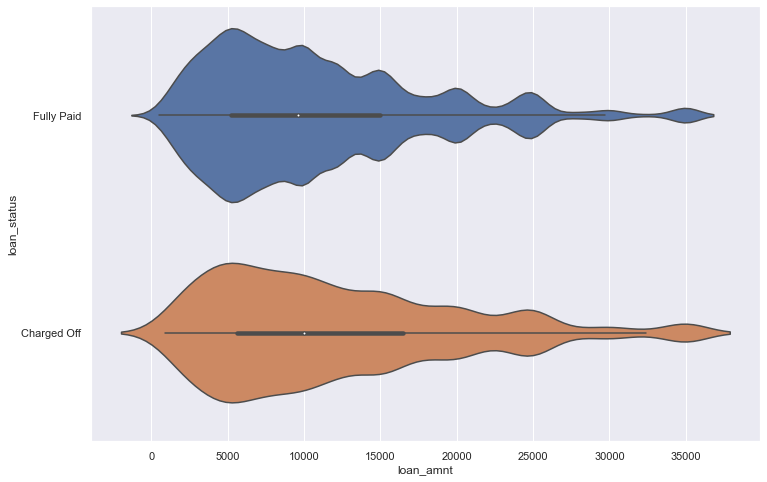

In [67]:
sns.set(rc={'figure.figsize':(12,8)})
sns.violinplot(df, x='loan_amnt', y='loan_status')

**Observation** *Loan amount does not seem to paly any role in the people defaulting the loan, with histograms and quantiles nearly overlapping*

<Axes: xlabel='loan_amnt', ylabel='grade'>

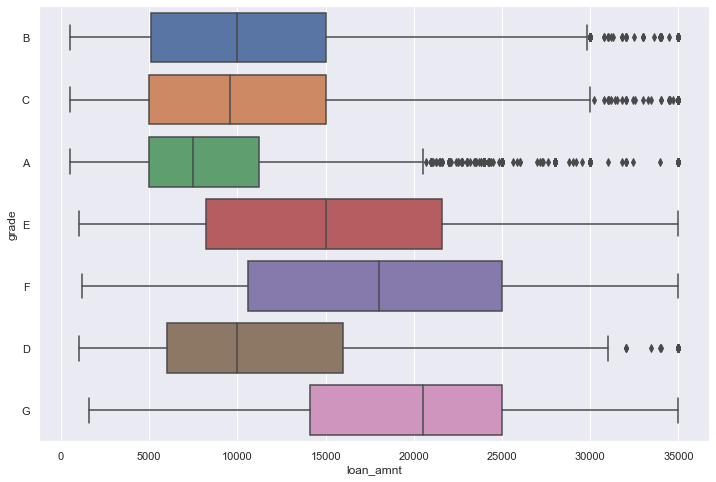

In [68]:
sns.boxplot(df, x='loan_amnt', y='grade')

**Observation** *Loan grade is not assigned based on the total loan amount*

<Axes: xlabel='grade', ylabel='count'>

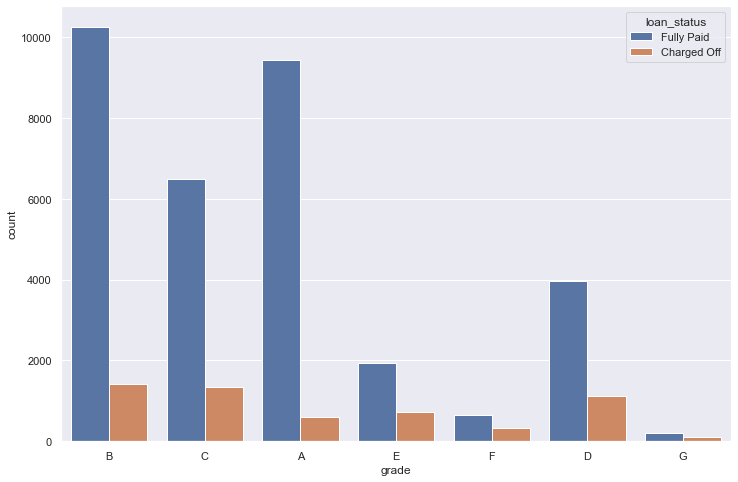

In [69]:
sns.countplot(df, x='grade', hue='loan_status')

**Observation** *Higher graded loans have more chance of default in %age terms.*

**Let us see if different loan_grades are being charged with different interest rates**

<Axes: xlabel='int_rate', ylabel='grade'>

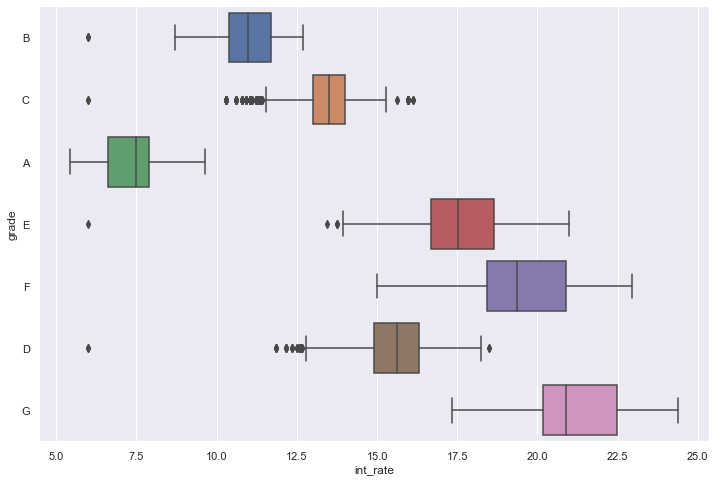

In [70]:
sns.boxplot(df, x='int_rate', y='grade')

**Observation** *Yes, our assumption was correct the lender might be doing risk assessment and charging higher interest on the higher graded loans. This also explains the previous observation of (higher graded loans have more chance of default in %age terms)*

**Let us see if determine the factors that might be helpful to grade the loans higher**

<Axes: xlabel='annual_inc', ylabel='grade'>

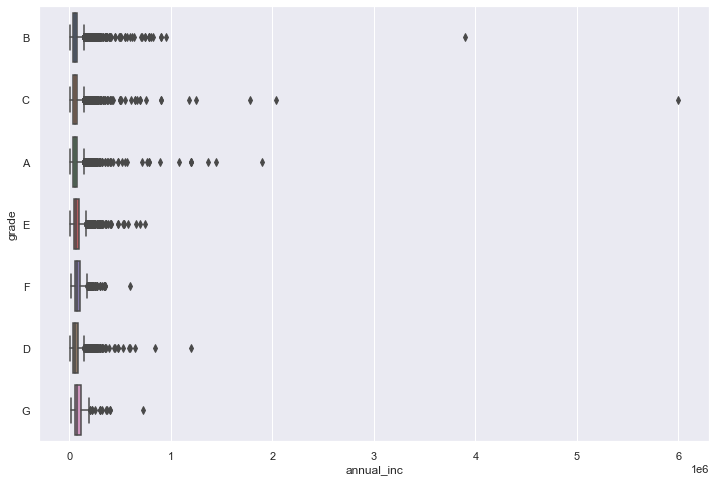

In [71]:
sns.boxplot(df, x='annual_inc', y='grade')

**Observation** *The quantiles and median seems to be very similary distributed in each of the grades with longer tail of outliers in A, B, C grades, meaning it plays good role to be getting assigned lower grade but might not be that signifincat to cause huge shift in quantiles or median towards right.*

<Axes: xlabel='home_ownership', ylabel='count'>

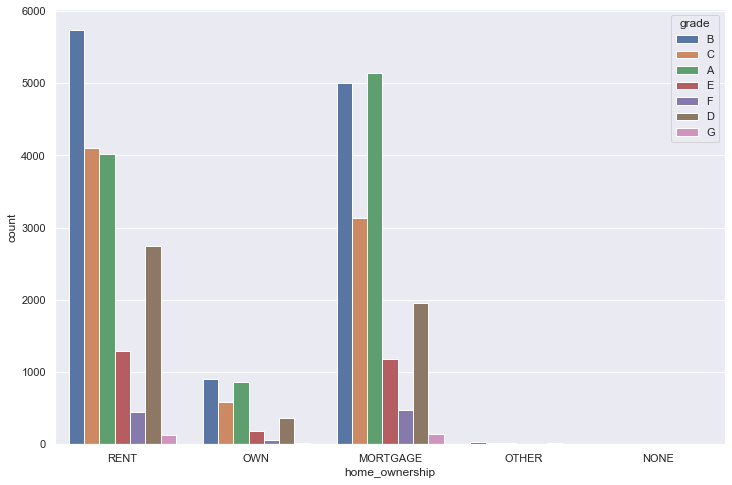

In [72]:
sns.countplot(df, x='home_ownership', hue='grade')

**Observation** *We can draw two observations here, one is the lender has granted lesser loans to home owners when compared to other categories. Also we can clearly see that home owners and mortgagers get significantly higher grade A (less risky, low interest) loans. Infact, grade A loan numbers in both these categories are similar to grade B loan numbers.*

<Axes: xlabel='count', ylabel='grade'>

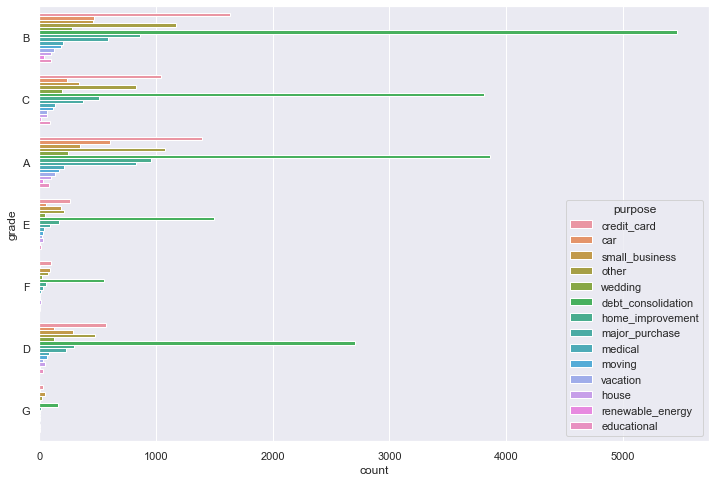

In [73]:
sns.countplot(df, y='grade', hue='purpose')

**Observation** *Seems like purpose does not play major role in loan grade.*

<Axes: xlabel='revol_bal', ylabel='grade'>

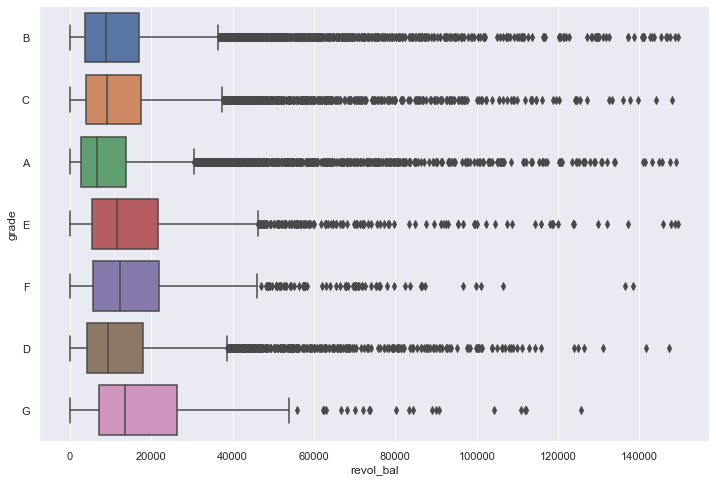

In [74]:
sns.boxplot(df, x='revol_bal', y='grade')

**Observation** *Revolving balance is the average amount of credit taken in absolute terms. We can claerly see that the people with lower grades utilize less amount of credit on average. It is a major factor in calculating the credit score, hence the people with better money management habits get assigned lower garded loans that charge lesser interest. But there are many outliers in all the grades.*

<Axes: xlabel='revol_util', ylabel='grade'>

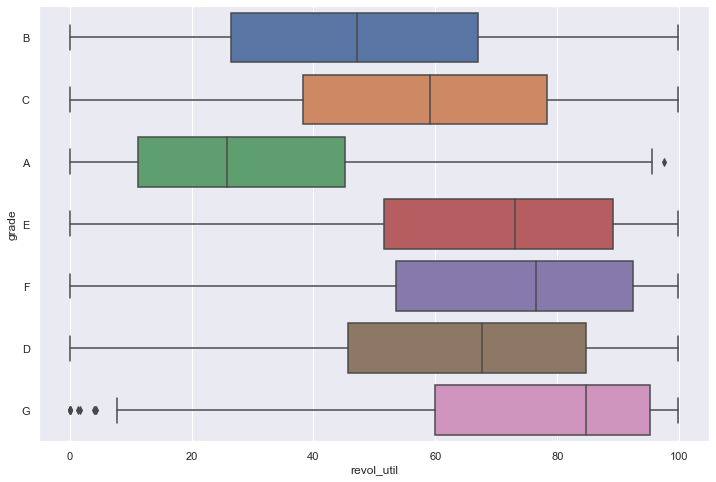

In [75]:
sns.boxplot(df, x='revol_util', y='grade')

**Observation** *Revolving Utilization is the percentage of assigned credit a person is utilizing. Here in percentage terms it becomes very obvious how people with lower grades utiliize their credit properly and might be having better credit scores to get lower graded loans.*

<Axes: xlabel='count', ylabel='grade'>

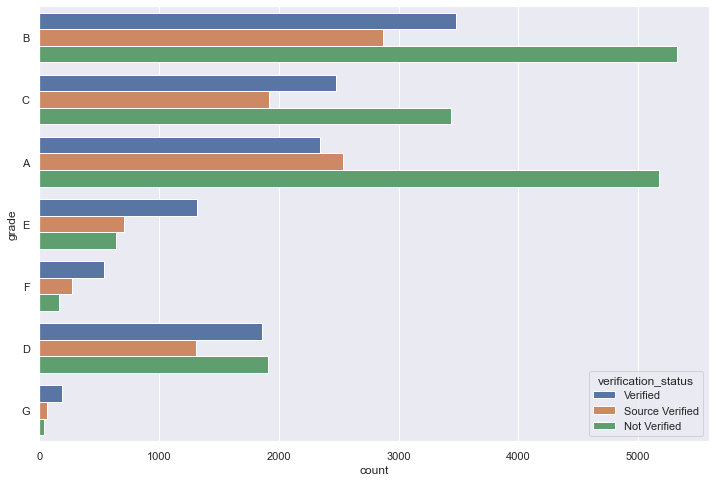

In [76]:
sns.countplot(df, y='grade', hue='verification_status')

**Observation** *Not very obvious at every garde but bank does more verification (verified or source verified) in cases of higer graded loans. Maybe as the people might have worse credit scores, making banks do more verification.*

<Axes: xlabel='count', ylabel='grade'>

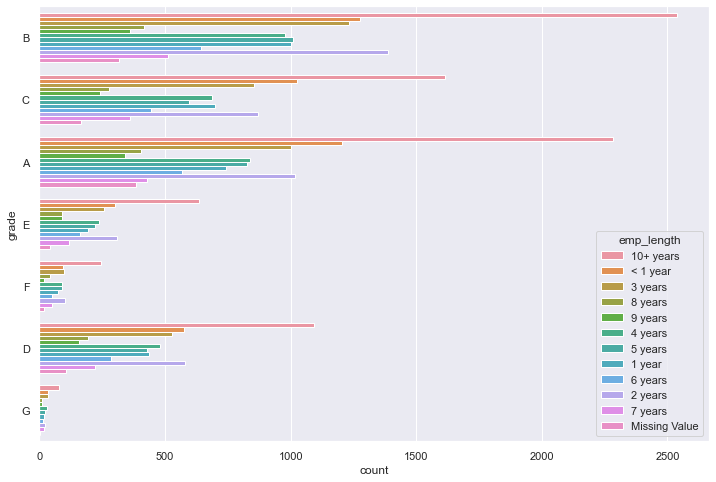

In [77]:
sns.countplot(df, y='grade', hue='emp_length')

**Observation** *Conclusive evidance not found.*

<Axes: xlabel='delinq_2yrs', ylabel='grade'>

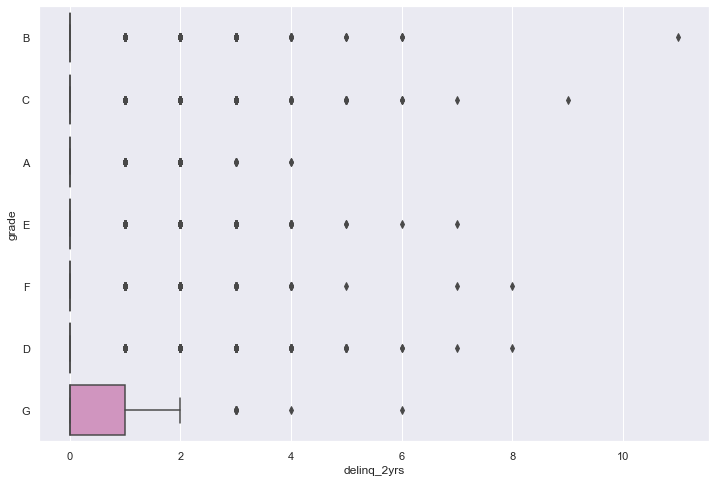

In [78]:
sns.boxplot(df, x='delinq_2yrs', y='grade')

**Observation** *Majority of people have not missed missed payments by more than 30 days in last 2 years.(Many outliers also present in each category) Only in G grade loans atleast 25% of people have missed atlest 1 payment.

**Let us now make histograms for all the numeric variables to see if can spot something.**

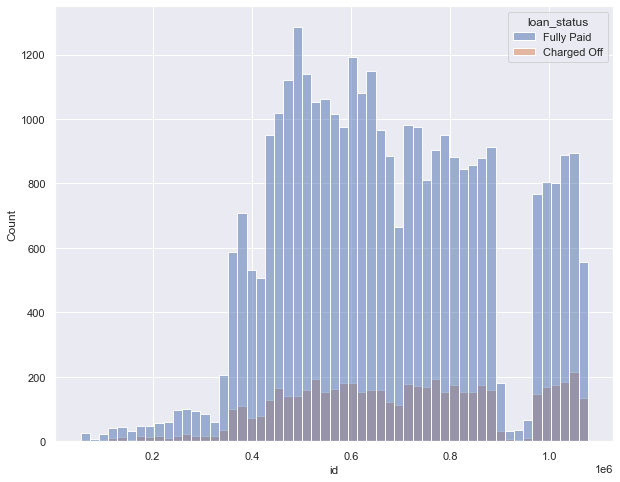

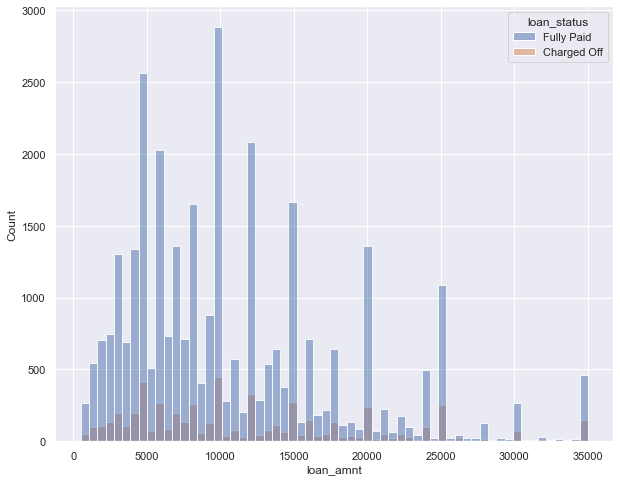

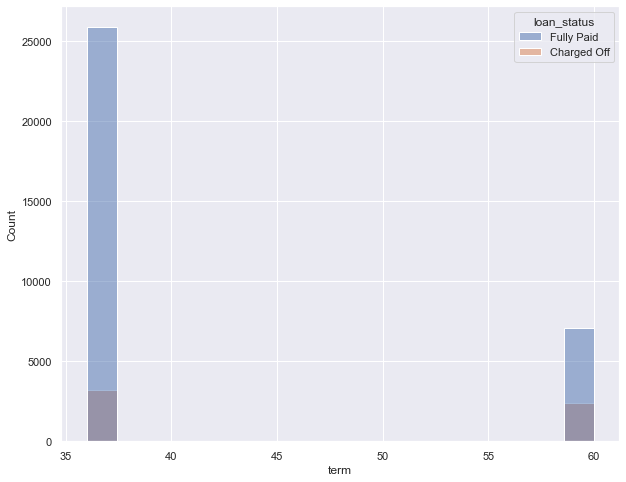

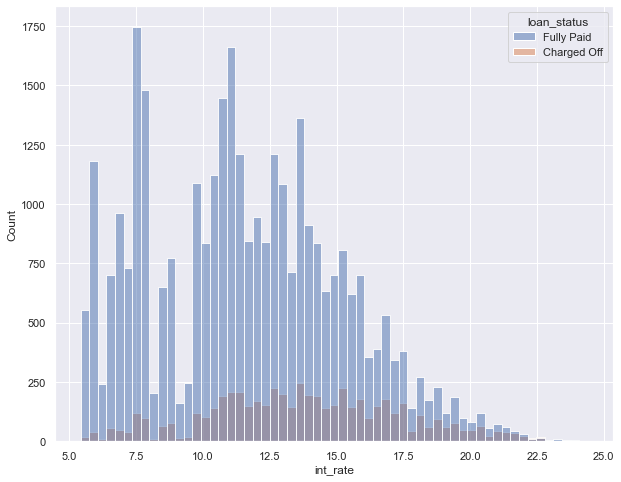

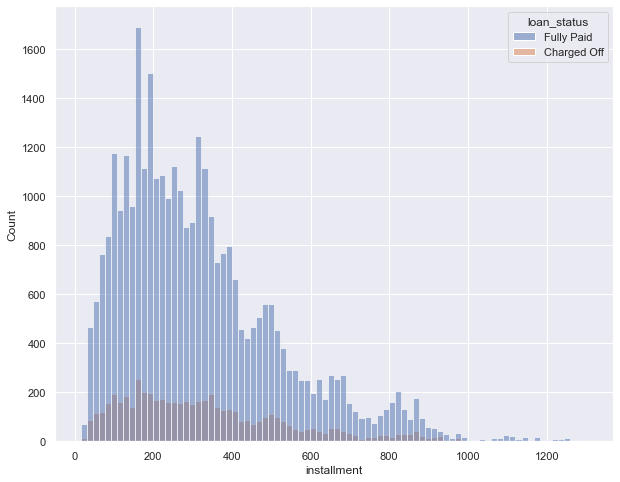

...

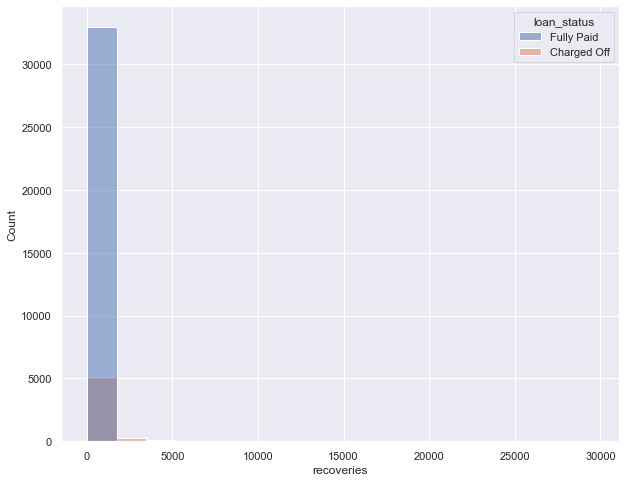

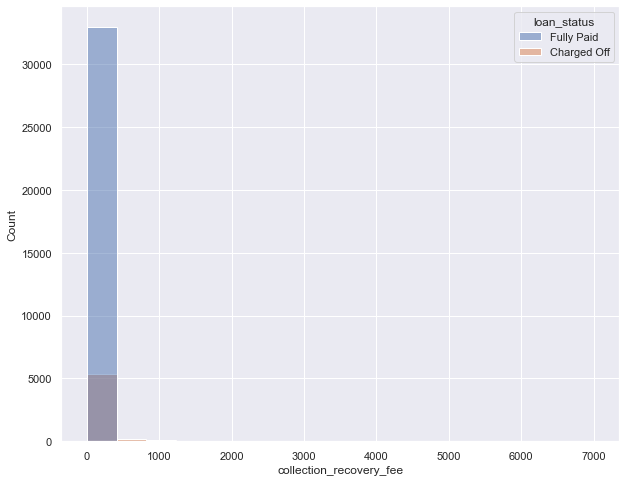

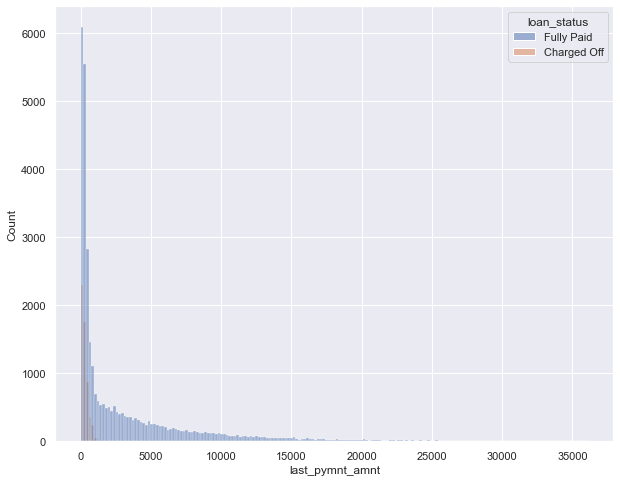

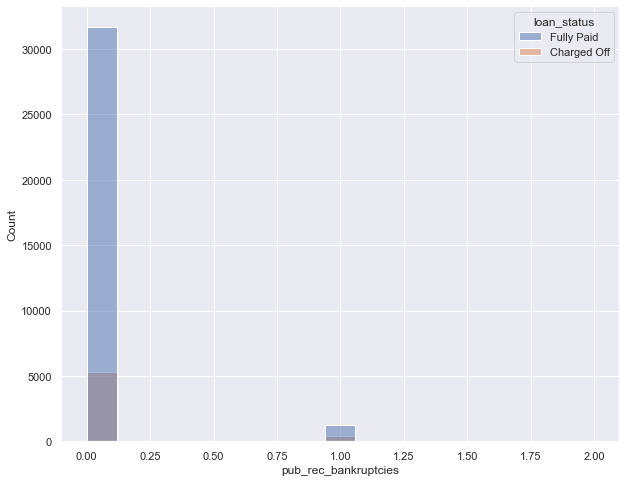

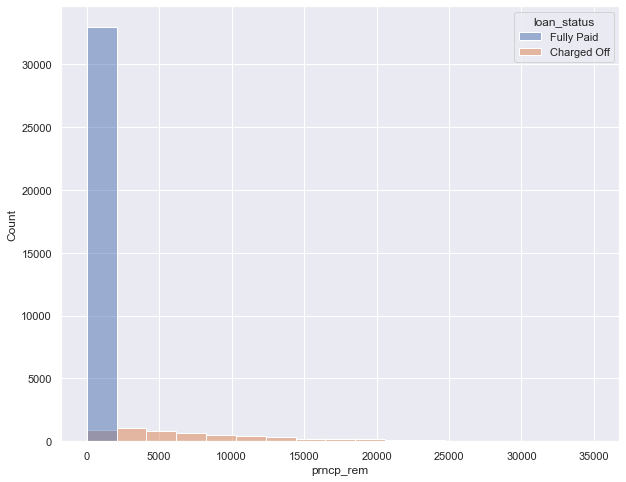

In [79]:
sns.set(rc={'figure.figsize':(10,8)})
for i in df.columns:
    if df[i].dtype!=object:
        sns.histplot(df, x=i, hue='loan_status')
        plt.show()

**Let us now make countplots for all the non_numeric variables to see if can spot something.**

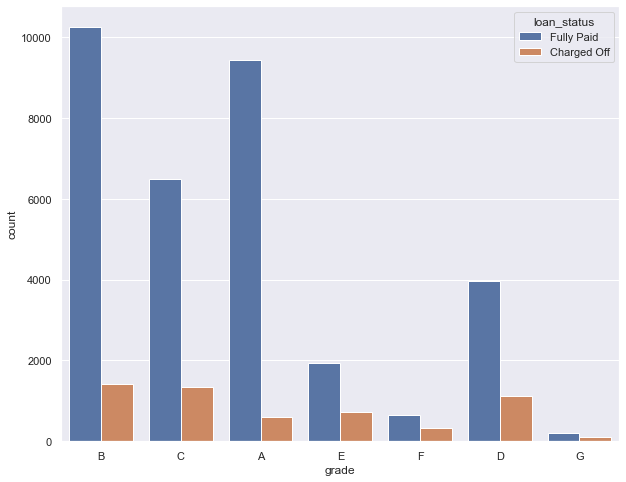

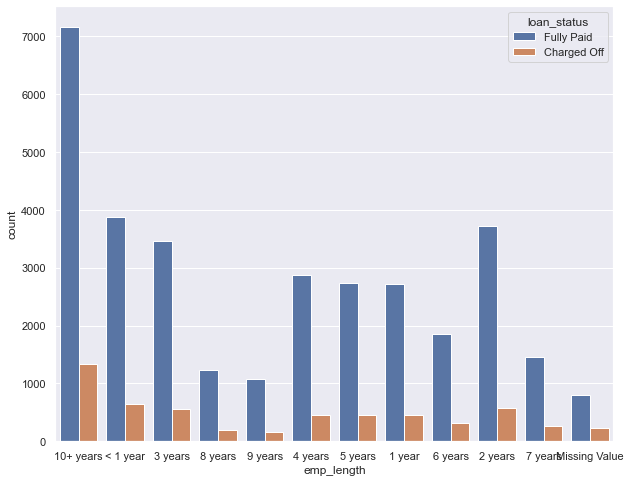

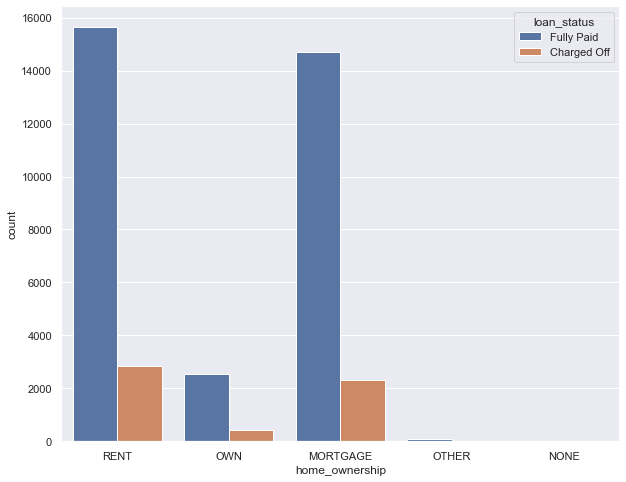

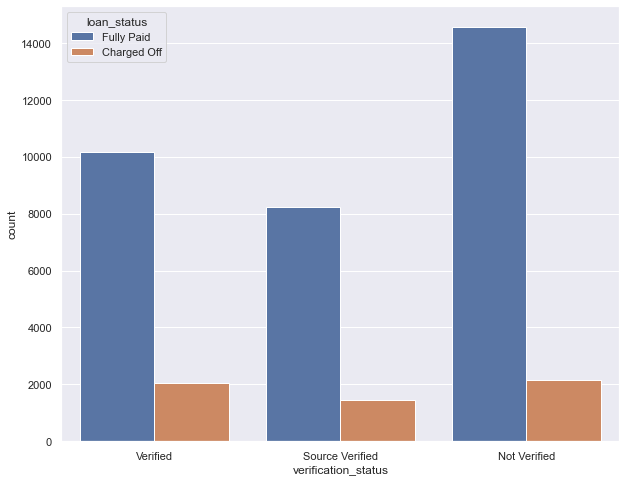

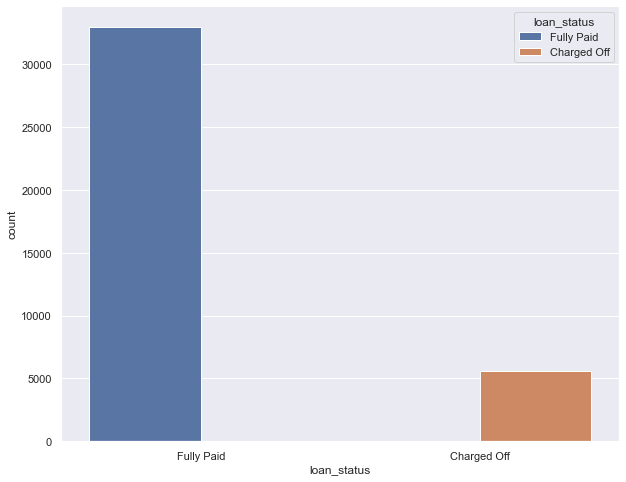

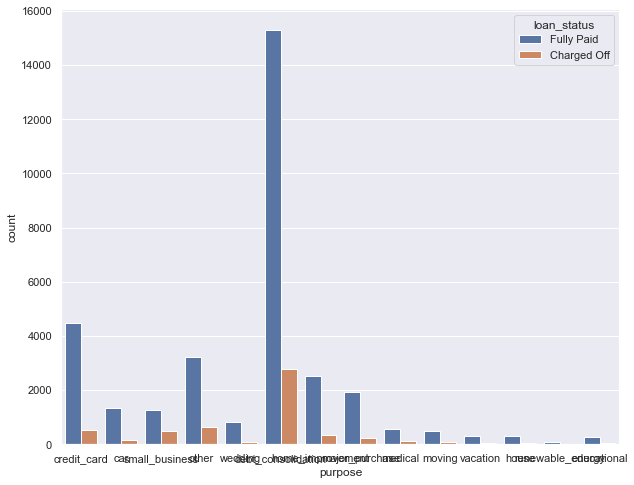

In [80]:
#Also limiting to 
for i in df.columns:
    if (df[i].dtype==object and df[i].nunique()<20):
        sns.countplot(df, x=i, hue='loan_status')
        plt.show()

# Let us now start with Bivariate Analysis

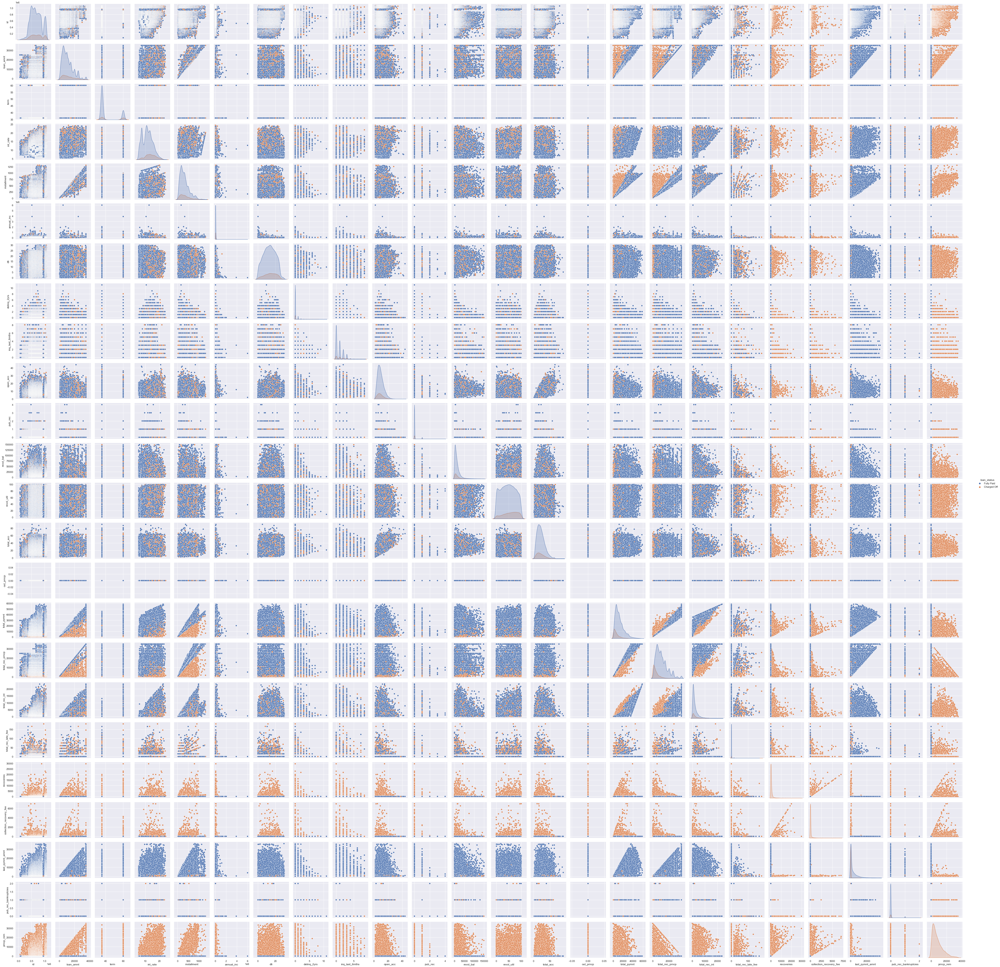

In [81]:
sns.pairplot(df, hue='loan_status')

**Normally we can use bivariate analysis to see how change in one variable tends to change another variable**

*This can be done using **Correlation Plots**. For correlation plots we need two variables that are numeric and for results both of them should be continuos. Here we are using **loan_amnt** as main feature as it one of the most prominent continuous numeric feature.*

correlation coeff:  0.3012652363773913


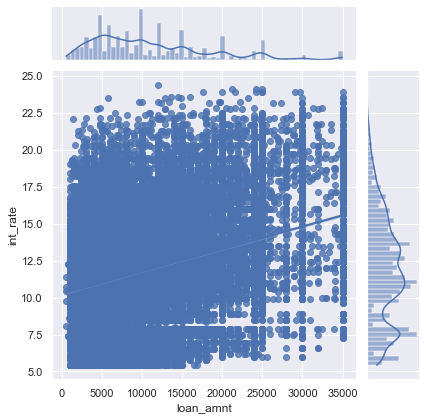

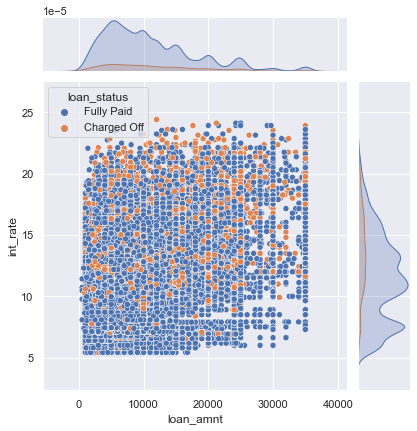

In [82]:
sns.set(rc={'figure.figsize':(15,10)})

sns.jointplot(df, x='loan_amnt', y='int_rate', kind='reg')
sns.jointplot(df, x='loan_amnt', y='int_rate', hue='loan_status')
print('correlation coeff: ',stats.pearsonr(df['loan_amnt'], df['int_rate'])[0])

**Observation** *There is a minor correlation of 30%.*

correlation coeff:  0.2689993990756643


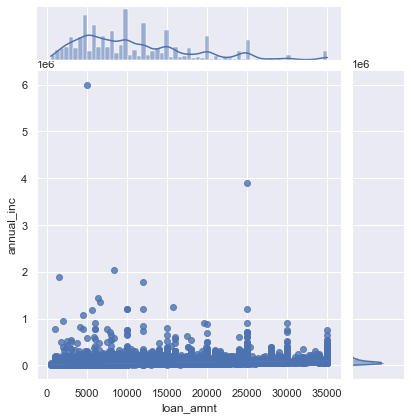

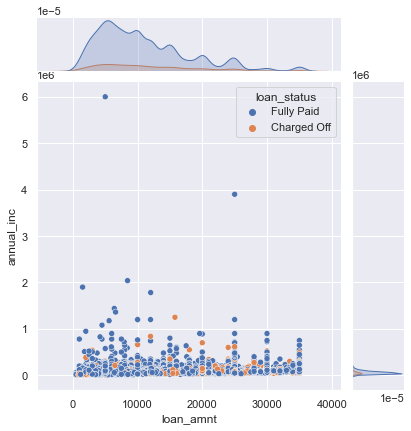

In [83]:
sns.jointplot(df, x='loan_amnt', y='annual_inc', kind='reg')
sns.jointplot(df, x='loan_amnt', y='annual_inc', hue='loan_status')
print('correlation coeff: ',stats.pearsonr(df['loan_amnt'], df['annual_inc'])[0])

**Observation** *We can see that there minor correlation.*

correlation coeff:  0.3140222066227738


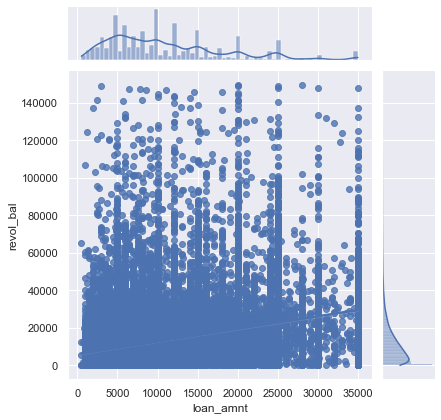

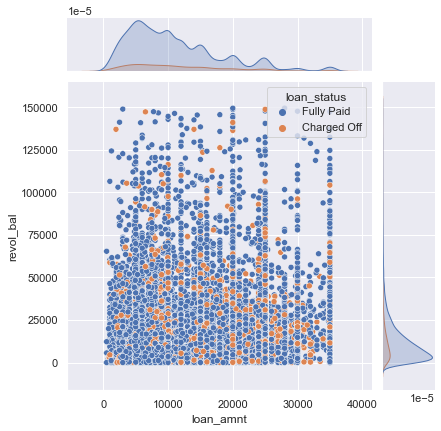

In [84]:
sns.jointplot(df, x='loan_amnt', y='revol_bal', kind='reg')
sns.jointplot(df, x='loan_amnt', y='revol_bal', hue='loan_status')
print('correlation coeff: ',stats.pearsonr(df['loan_amnt'], df['revol_bal'])[0])

**Observation** *We can see that there is a good 30+% correlation. Concluding that pople who use more absolute credit are most likely to have higher loan sanctioned by the lender.*

correlation coeff:  0.0652470091155389


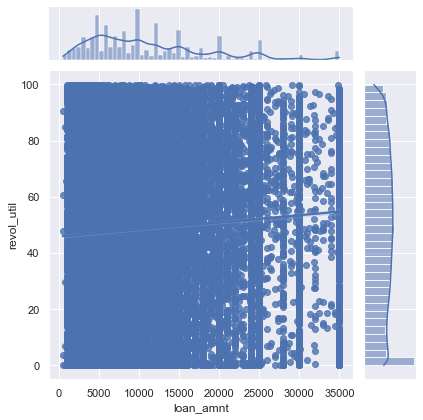

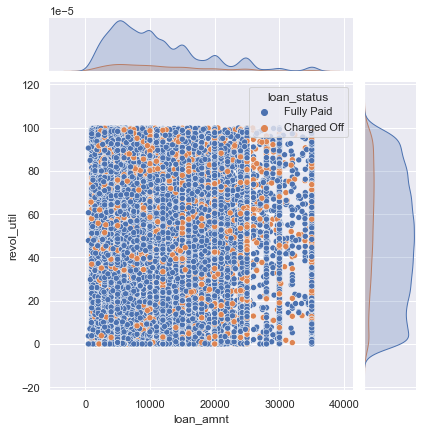

In [85]:
sns.jointplot(df, x='loan_amnt', y='revol_util', kind='reg')
sns.jointplot(df, x='loan_amnt', y='revol_util', hue='loan_status')
print('correlation coeff: ',stats.pearsonr(df['loan_amnt'], df['revol_util'])[0])

**Observation** *There barely any correlation between between the two variables.*

correlation coeff:  0.25617929816607554


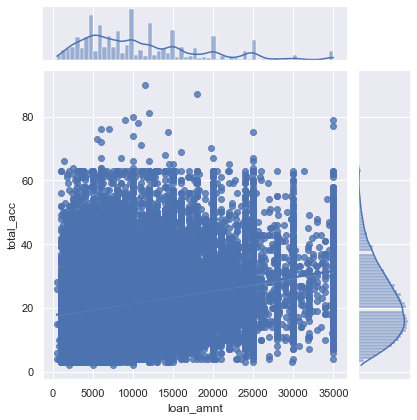

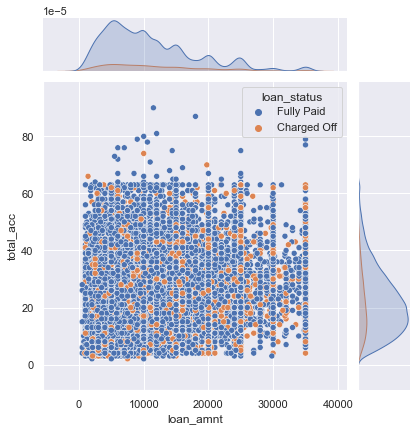

In [86]:
sns.jointplot(df, x='loan_amnt', y='total_acc', kind='reg')
sns.jointplot(df, x='loan_amnt', y='total_acc', hue='loan_status')
print('correlation coeff: ',stats.pearsonr(df['loan_amnt'], df['total_acc'])[0])

**Observation** *There is about minor 25% correlation between the two variables.*

correlation coeff:  0.8819103258047376


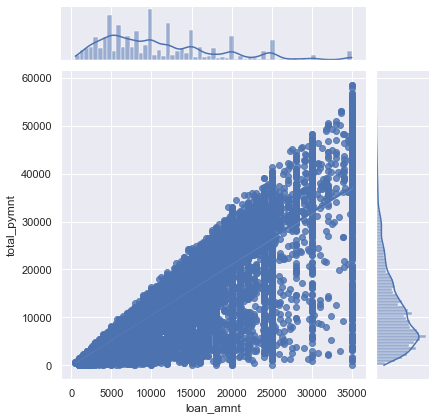

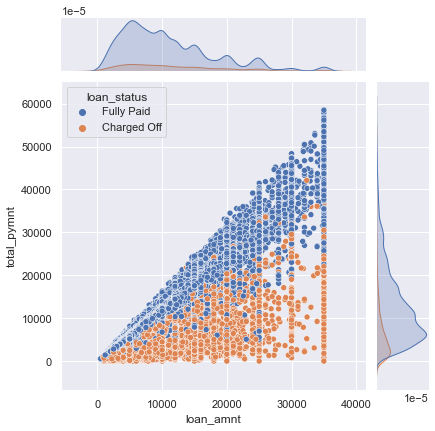

In [87]:
sns.jointplot(df, x='loan_amnt', y='total_pymnt', kind='reg')
sns.jointplot(df, x='loan_amnt', y='total_pymnt', hue='loan_status')
print('correlation coeff: ',stats.pearsonr(df['loan_amnt'], df['total_pymnt'])[0])

**Observation** *There is very high 88% correlation between the two variables. This is mainly due to tha fact that most of the would have paid the loan amount and the interest amount and hence are very correlated. Also we can clarely see that charged off (defaulters) and fully paid users are segrigated, which is understandable. Also we can see few fully paid poins inbetween defaulters, we had identifed this before as well. There could be some errors in data set or there could be some other factor into play that is not getting captured in the dataset, somthing like government subsidy (the borrower would be paing only a part of loan himself and government contributing the rest making the total higer than loan amount incluing interest).*

correlation coeff:  0.84586979587196


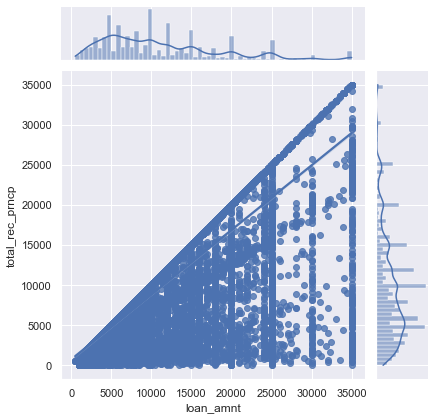

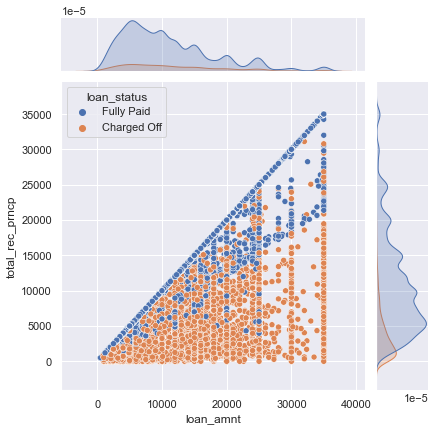

In [88]:
sns.jointplot(df, x='loan_amnt', y='total_rec_prncp', kind='reg')
sns.jointplot(df, x='loan_amnt', y='total_rec_prncp', hue='loan_status')
print('correlation coeff: ',stats.pearsonr(df['loan_amnt'], df['total_rec_prncp'])[0])

**Observation** *Again there is a very high 84% correlation for the same reasons as previous two variables. Same issues also getting highlighted as well.*

correlation coeff:  0.7283429059413484


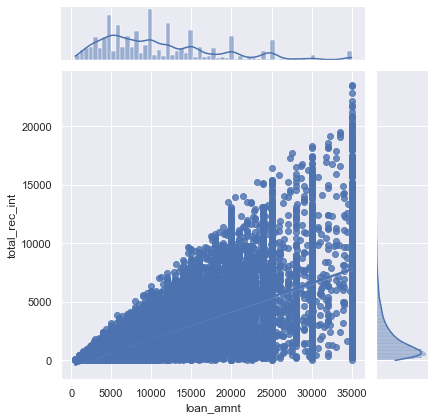

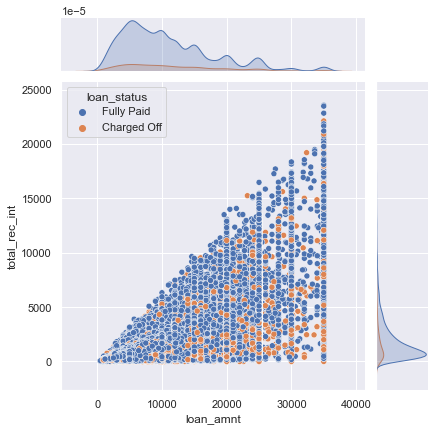

In [89]:
sns.jointplot(df, x='loan_amnt', y='total_rec_int', kind='reg')
sns.jointplot(df, x='loan_amnt', y='total_rec_int', hue='loan_status')
print('correlation coeff: ',stats.pearsonr(df['loan_amnt'], df['total_rec_int'])[0])

**Observation** *Again there is a good 73% correlation for the same reasons as previous variables.*

correlation coeff:  0.1427892610412201


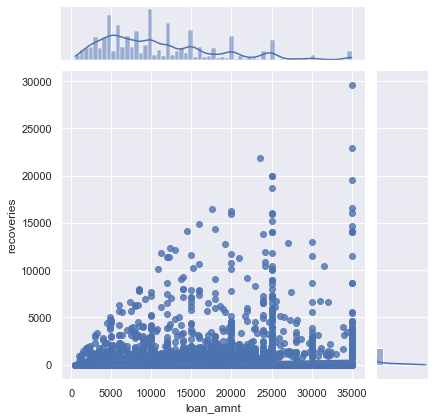

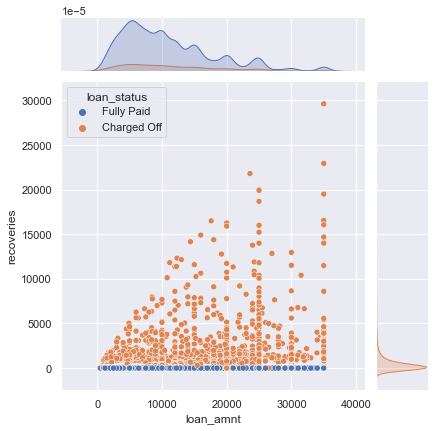

In [90]:
sns.jointplot(df, x='loan_amnt', y='recoveries', kind='reg')
sns.jointplot(df, x='loan_amnt', y='recoveries', hue='loan_status')
print('correlation coeff: ',stats.pearsonr(df['loan_amnt'], df['recoveries'])[0])

**Observation** *There is a very low correlation here. But we can clearly see that this could be dut to majority of the people how have paid the whole loan and didn't need to pay via recovery. We can try to check this for the defaulters only to see the correlation for better picture*

In [91]:
df_charged_off=df[df['loan_status']=='Charged Off']

correlation coeff:  0.31018492071809645


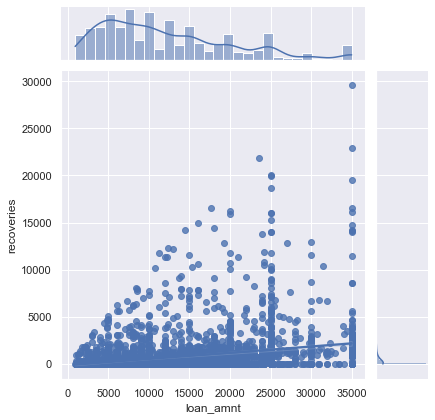

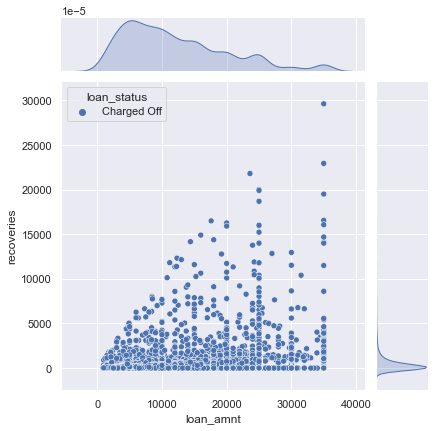

In [92]:
sns.jointplot(df_charged_off, x='loan_amnt', y='recoveries', kind='reg')
sns.jointplot(df_charged_off, x='loan_amnt', y='recoveries', hue='loan_status')
print('correlation coeff: ',stats.pearsonr(df_charged_off['loan_amnt'], df_charged_off['recoveries'])[0])

**Observation** *We can clearly see that there is a good 30+% correlation betweent the two variables when we use the sebset of people who have defaulted.*